In [1]:
'''
In this notebook I demonstrate how to apply softimpute method on a partially revealed
image of mona lisa. The recovered image looks pretty nice!
'''

from PIL import Image
import numpy as np
from numpy.linalg import inv
from numpy.linalg import norm

image = Image.open('mona_bw.jpg').convert('L')  # Convert to grayscale
image_array = np.array(image)
image_array.shape

ratio=0.3
mask = np.random.rand(*image_array.shape) < ratio  # Create a mask with r% True (revealed)
test_image_array = image_array.copy()
test_image_array[~mask] = 0  # Set unrevealed pixels to 0
test_image_array=test_image_array.astype(float)


Matplotlib created a temporary config/cache directory at /var/folders/_x/fh3t8wcj3_xbs4fddcxmbpc00000gn/T/matplotlib-jp2zio3d because the default path (/Users/hansshen/.matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


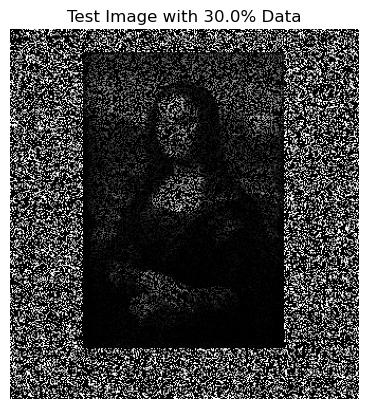

In [2]:
import matplotlib.pyplot as plt

plt.imshow(test_image_array, cmap='gray')
plt.title(f'Test Image with {ratio*100}% Data')
plt.axis('off')
plt.show()


In [3]:
def soft_impute_ws(Y,OMEGA,lambda_vals,max_iter=500,tol=10**(-4)):
    num_iters,Bs=[],[]
    B=np.zeros(Y.shape)
    for lambda_val in reversed(lambda_vals):
        prev_objective=np.inf
        num_iter=0
        while num_iter<=max_iter:
            #update B by the observed entries of Y
            B[OMEGA]=Y[OMEGA]
            #SVD of B
            U,S,VT=np.linalg.svd(B,full_matrices=False)
            #apply soft thresholding operator
            S_threshold=np.maximum(S-lambda_val,0)
            B=U@np.diag(S_threshold)@VT
            #calculate objective 
            cur_objective=0.5*np.linalg.norm(OMEGA*(Y-B))**2+lambda_val*np.sum(S_threshold)
            #decide continue or break 
            if abs(prev_objective-cur_objective)/prev_objective<tol:
                break 
            else:
                prev_objective=cur_objective
                num_iter+=1
        num_iters.append(num_iter)
        Bs.append(B.copy())
    num_iters.reverse()
    Bs.reverse()
    return Bs,num_iters


In [4]:
lambda_vals=np.logspace(-8,8,40)
OMEGA=mask
Bs,num_iters=soft_impute_ws(test_image_array,OMEGA,lambda_vals)

/var/folders/_x/fh3t8wcj3_xbs4fddcxmbpc00000gn/T/ipykernel_95417/1485820669.py:18: RuntimeWarning: invalid value encountered in double_scalars
  if abs(prev_objective-cur_objective)/prev_objective<tol:


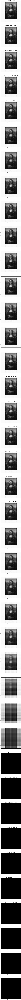

In [5]:
n=len(lambda_vals)
fig=plt.figure(figsize=(12,n*12))
for index,lambda_val in enumerate(lambda_vals):
    ax=fig.add_subplot(n,1,index+1)
    ax.imshow(Bs[index],cmap='gray')
    ax.set(title="Completed Image with Lambda {}".format(lambda_val))
plt.show()


In [26]:
'''
Now trying to implement a warm start and grid search over a range of value for the ALS method, similar
to the warm start from softimpute as well

input: Y:partially observed matrix,ranks:list of ranks from smallest to largest;
lambda_vals:list of lambda_vals from smallest to largest
alpha=hyperparam for initializing A and B for each new rank r; A_ini=alpha*A_init_old+(1-a)*U[:,r]

returns a list of optimal models with each rank value
'''
def als_ws(Y,OMEGA,ranks,lambda_vals,alpha=0.1,max_iter=500,tol=10**(-4)):
    #initialization
    m,n=Y.shape
    opt_models=[{} for _ in range(len(ranks))] 
    U,S,VT=np.linalg.svd(Y,full_matrices=False)
    A,B=U[:,:ranks[0]].T,VT[:ranks[0],:]
    
    #training: ranks from small to big, and lambdas from large to small 
    for index,rank in enumerate(ranks):
        opt_loss=np.inf
        if index:
            A=alpha*(np.vstack([A]+[np.zeros(m) for _ in range(rank-ranks[index-1])]))+(1-alpha)*U[:,:rank].T
            B=alpha*(np.vstack([B]+[np.zeros(n) for _ in range(rank-ranks[index-1])]))+(1-alpha)*VT[:rank,:]
        for lambda_val in lambda_vals[::-1]:
            lambda_I=np.eye(rank)*lambda_val
            loss=norm(OMEGA*(Y-A.T@B))**2+lambda_val*(norm(A)**2+norm(B)**2)
            num_iter=0 
            while (num_iter<max_iter):
                A=inv(lambda_I+B@B.T)@(B@Y.T)
                B=inv(lambda_I+A@A.T)@(A@Y)
                newloss=norm(OMEGA*(Y-A.T@B))**2+lambda_val*(norm(A)**2+norm(B)**2)
                if abs(loss-newloss)/newloss<tol:
                    break 
                loss=newloss
                num_iter+=1
            if newloss<opt_loss:
                opt_loss=newloss
                opt_model={"rank":rank,
                           "lambda_val":lambda_val,
                           "A":A,
                           "B":B,
                           "loss":newloss
                          }
        opt_models[index]=opt_model
    return opt_models